<a href="https://colab.research.google.com/github/Nilanjan-Chatterjee/Aahar/blob/main/FasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/harshatejas/pytorch_custom_object_detection.git

Cloning into 'pytorch_custom_object_detection'...
remote: Enumerating objects: 447, done.
remote: Counting objects: 100% (447/447), done.
remote: Compressing objects: 100% (441/441), done.
remote: Total 447 (delta 28), reused 380 (delta 4), pack-reused 0
Receiving objects: 100% (447/447), 36.73 MiB | 25.38 MiB/s, done.
Resolving deltas: 100% (28/28), done.


In [ ]:
%cd /content/pytorch_custom_object_detection

/content/pytorch_custom_object_detection


In [ ]:
# Imports
import os
import numpy as np
import pandas as pd
import cv2

import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from engine import train_one_epoch, evaluate
import utils
import transforms as T

In [ ]:
#import all the libraries
import os
import torch
import glob
from torch.utils.data import Dataset
import time
import copy
import numpy as np
import math
import torch.nn as nn
import warnings
warnings.filterwarnings("ignore")
from PIL import Image
from torch.utils.data.dataset import Dataset  # For custom data-sets
import torchvision.transforms as transforms
from PIL import Image
import torchvision
import matplotlib.pyplot as plt
import argparse
import logging
import sys
import cv2
import torch.nn as nn
from torch import optim
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader, random_split
from collections import OrderedDict
import random

In [ ]:
#connecting the drive to colab
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Creating dataset
class ListDataset(Dataset):
    def __init__(self, img_files,label_files, img_size=416,transforms = None):
        
        #super(DataLoaderSegmentation, self).__init__()
        #image_class=os.listdir(img_path)
        #self.img_files=[]
        #for cls in image_class:
         #   self.img_files += glob.glob(img_path+cls+'/'+'*.bmp')
        self.transforms = transforms
        #self.label_files = []
        self.inputs_dtype = torch.float64
        self.targets_dtype = torch.long
        self.img_files=img_files
        self.label_files=label_files
        
        #for img_path1 in self.img_files:
          
          #self.label_files.append(label_path+cls+'neucleus'+img_path1[-7:-4]+'.txt')
        self.img_shape = (img_size, img_size)
        self.max_objects = 200
        


    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, index):

        #---------
        #  Image
        #---------
        
        img_path = self.img_files[index % len(self.img_files)].rstrip()
        
        img = cv2.imread(img_path)
        #print(type(Image.open(img_path)))
        h, w, _ = img.shape
        dim_diff = np.abs(h - w)
        # Upper (left) and lower (right) padding
        pad1, pad2 = dim_diff // 2, dim_diff - dim_diff // 2
        # Determine padding
        pad = ((pad1, pad2), (0, 0), (0, 0)) if h <= w else ((0, 0), (pad1, pad2), (0, 0))
        # Add padding
        pad_img = np.pad(img, pad, 'constant', constant_values=128)

        padded_h, padded_w, _ = pad_img.shape

        # Resize
        pad_img = cv2.resize(pad_img, self.img_shape)
        # Channels-first
        #input_img = pad_img[:, :, ::-1].transpose((2, 0, 1)).copy()
        # As pytorch tensor
        #input_img = torch.from_numpy(input_img).float().div(255.0)
        
        #---------
        #  Label
        #---------

        label_path = self.label_files[index % len(self.img_files)].rstrip()

        labels = None
        if os.path.exists(label_path):
            labels = np.loadtxt(label_path).reshape(-1, 5)
            
            #print(labels)
            # Extract coordinates for unpadded + unscaled image
            x1 = w * (labels[:, 1] - labels[:, 3]/2)
            y1 = h * (labels[:, 2] - labels[:, 4]/2)
            x2 = w * (labels[:, 1] + labels[:, 3]/2)
            y2 = h * (labels[:, 2] + labels[:, 4]/2)
            # Adjust for added padding
            x1 += pad[1][0]
            y1 += pad[0][0]
            x2 += pad[1][0]
            y2 += pad[0][0]
            # Calculate ratios from coordinates
            labels[:, 1] = x1  / padded_w
            labels[:, 2] = x2 / padded_w
            labels[:, 3] = y1 / padded_h
            labels[:, 4] = y2 / padded_h
        labelsx=[]
        obj=[]
        iscorwd=[]
        for i in range(len(labels)):
          labelsx.append(labels[i][1:].tolist())
          obj.append(1)
          #iscrowd.append(1)
        labelsx=np.array(labelsx)
        
        num_box=len(labels)
        # Fill matrix
        filled_labels = np.zeros((self.max_objects, 5))
        if labels is not None:
            filled_labels[range(len(labels))[:self.max_objects]] = labels[:self.max_objects]
        iscrowd = torch.zeros((num_box,), dtype=torch.int64)
        #img =img.reshape(3,1536,2048)
        labels=labelsx
        labels=labels.tolist()
        #obj=obj.tolist()
        #print(labels)
        #print(obj)
        labels=np.array(labels)
        obj=np.array(obj)
        #labels=labels.tolist()
        #obj=obj.tolist()
        img=img/255
              
        


        boxes = torch.as_tensor(labels, dtype = torch.float32)
        labels = torch.tensor(obj, dtype=torch.int64)
		
        image_id = torch.tensor([index])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        
        iscrowd = torch.tensor(obj, dtype=torch.int64)
        
        #img=img.astype(double)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        #print("start list target") 
        #print(target)
        #print("end list target")
       # print(boxes)
        if self.transforms is not None:
          input_img, target = self.transforms(input_img, target)
        input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
        #print(labels)
        #print(image_id)
        #print(area)
        #print(iscrowd)
        #print("image",type(input_img),"boxes:",type(boxes),",labels:",type(labels),",image id:",image_id,",area:",area,",iscrowd:",iscrowd)
        return input_img, target
        

In [ ]:
#Creating dataset
class ListDataset(Dataset):
    def __init__(self, img_files,label_files, img_size=416,transforms = None):
        
        #super(DataLoaderSegmentation, self).__init__()
        #image_class=os.listdir(img_path)
        #self.img_files=[]
        #for cls in image_class:
         #   self.img_files += glob.glob(img_path+cls+'/'+'*.bmp')
        self.transforms = transforms
        #self.label_files = []
        self.inputs_dtype = torch.float64
        self.targets_dtype = torch.long
        self.img_files=img_files
        self.label_files=label_files
        
        #for img_path1 in self.img_files:
          
          #self.label_files.append(label_path+cls+'neucleus'+img_path1[-7:-4]+'.txt')
        self.img_shape = (img_size, img_size)
        self.max_objects = 200
        


    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, index):

        #---------
        #  Image
        #---------
        
        img_path = self.img_files[index % len(self.img_files)].rstrip()
        
        img = cv2.imread(img_path)
        input_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #print(input_img.shape)
        #print(type(Image.open(img_path)))
        #h, w, _ = img.shape
        #dim_diff = np.abs(h - w)
        # Upper (left) and lower (right) padding
        #pad1, pad2 = dim_diff // 2, dim_diff - dim_diff // 2
        # Determine padding
        #pad = ((pad1, pad2), (0, 0), (0, 0)) if h <= w else ((0, 0), (pad1, pad2), (0, 0))
        # Add padding
        #pad_img = np.pad(img, pad, 'constant', constant_values=128)

        #padded_h, padded_w, _ = pad_img.shape

        # Resize
        #pad_img = cv2.resize(pad_img, self.img_shape)
        # Channels-first
        #input_img = pad_img[:, :, ::-1].transpose((2, 0, 1)).copy()
        # As pytorch tensor
        #input_img = torch.from_numpy(input_img).float().div(255.0)
        
        #---------
        #  Label
        #---------

        label_path = self.label_files[index % len(self.img_files)].rstrip()

        labels = None
        if os.path.exists(label_path):
            
            labels = np.loadtxt(label_path).reshape(-1, 4)
            #print("first time")
            #print(labels)
            # Extract coordinates for unpadded + unscaled image
            x1 = labels[:,0]-labels[:,2]/2#w * (labels[:, 1] - labels[:, 3]/2)
            y1 = labels[:,1]-labels[:,3]/2#h * (labels[:, 2] - labels[:, 4]/2)
            x2 = labels[:,0]+labels[:,2]/2#w * (labels[:, 1] + labels[:, 3]/2)
            y2 = labels[:,1]+labels[:,3]/2#h * (labels[:, 2] + labels[:, 4]/2)
            # Calculate ratios from coordinates
            labels[:, 0] = x1 # / padded_w
            labels[:, 1] = y1# / padded_w
            labels[:, 2] = x2# / padded_h
            labels[:, 3] = y2# / padded_h
        #print("second time")
        #print(labels)
        obj=[]
        iscorwd=[]
        for i in range(len(labels)):
         
          #l.append(labels)
          #labelsx.append(labels[i][:].tolist())
          obj.append(1)
          #iscrowd.append(1)
        labelsx=np.array(labels)
        
        num_box=len(labels)
        # Fill matrix
        filled_labels = np.zeros((self.max_objects, 4))
        if labels is not None:
            filled_labels[range(len(labels))[:self.max_objects]] = labels[:self.max_objects]
        iscrowd = torch.zeros((num_box,), dtype=torch.int64)
        #img =img.reshape(3,1536,2048)
        labels=labelsx
        labels=labels.tolist()
        #obj=obj.tolist()
        #print(labels)
        #print(obj)
        labels=np.array(labels)
        obj=np.array(obj)
        #labels=labels.tolist()
        #obj=obj.tolist()
        img=img/255
              
        


        boxes = torch.as_tensor(labels, dtype = torch.float32)
        labels = torch.tensor(obj, dtype=torch.int64)
        #boxes*=255
        image_id = torch.tensor([index])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        
        iscrowd = torch.tensor(obj, dtype=torch.int64)
        
        #img=img.astype(double)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        #print("start list target") 
        #print(target)
        #print("end list target")
       # print(boxes)
        if self.transforms is not None:
          input_img, target = self.transforms(input_img, target)
        #print("these are boxes:",boxes)
        #print(labels)
        #print(image_id)
        #print(area)
        #print(iscrowd)
        #print("image",type(input_img),"boxes:",type(boxes),",labels:",type(labels),",image id:",image_id,",area:",area,",iscrowd:",iscrowd)
        return input_img, target
        

In [ ]:
#creating dataloader
batch_size = 1
inp_dim = 800
input_path='/content/gdrive/MyDrive/Sipakmed/'
output_path='/content/gdrive/MyDrive/Sipakmed_result/'
image_class=os.listdir(input_path)
img_files=[]
for cls in image_class:
  temp=glob.glob(input_path+cls+'/'+'*.bmp') 
  for i in range(len(temp)):
    img_files.append([temp[i],cls])
random.shuffle(img_files)       
label_files = []
inputs_dtype = torch.float32
targets_dtype = torch.long
for img_path1 in img_files:
    label_files.append(output_path+img_path1[1]+'/neucleus'+img_path1[0][-7:-4]+'.txt')
print(len(label_files))
for i in range(len(img_files)):
  img_files[i]=img_files[i][0]
train_img=img_files[:576]      #576 data
val_img=img_files[576:780]     #204 data
test_img=img_files[780:]       #192 data
train_label=label_files[:576]
val_label=label_files[576:780]
test_label=label_files[780:]
train_dataset=ListDataset(train_img,train_label, img_size=inp_dim, transforms = get_transforms(train = True))

valid_dataset=ListDataset(val_img,val_label, img_size=inp_dim, transforms = get_transforms(train = False))
dataset__train=ListDataset(train_img,train_label, img_size=inp_dim, transforms = get_transforms(train = True))
dataset__test=ListDataset(train_img,train_label, img_size=inp_dim, transforms = get_transforms(train = True))
#torch.manual_seed(1)
#indices = torch.randperm(len(dataset)).tolist()
#dataset__train = torch.utils.data.Subset(dataset, indices[:-test_set_length])
#dataset__test = torch.utils.data.Subset(dataset_test, indices[-test_set_length:])
dataloaders = {'train': torch.utils.data.DataLoader(dataset__train, batch_size=batch_size, shuffle=True,num_workers=2,collate_fn = utils.collate_fn),
               'val': torch.utils.data.DataLoader(dataset__test, batch_size=batch_size, shuffle=True,num_workers=2,collate_fn = utils.collate_fn)}
dataloaders_test=torch.utils.data.DataLoader(ListDataset(test_img,test_label, img_size=inp_dim, transforms = get_transforms(train = False)), batch_size=batch_size, shuffle=True,num_workers=1)
#print(dataloaders['train'])
print(len(dataloaders['val']))
data_loader=dataloaders['train']
data_loader_test=dataloaders['val']
for i_batch, sampled_batch in enumerate(data_loader_test):
    img,targets=sampled_batch
    print("image")
    print(img)
    print("start target")
    #print(type(img))
    print(targets)
    print("end target")
    #targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    #for t in targets:
      #print(t)
    if i_batch == 0:
        break

966
576
image
(tensor([[[0.7216, 0.7098, 0.7059,  ..., 0.1608, 0.1569, 0.1765],
         [0.7059, 0.7176, 0.7137,  ..., 0.1569, 0.1569, 0.1608],
         [0.6941, 0.6902, 0.6902,  ..., 0.1412, 0.1294, 0.1451],
         ...,
         [0.4941, 0.4863, 0.4941,  ..., 0.5216, 0.5098, 0.4980],
         [0.4863, 0.4941, 0.4902,  ..., 0.5373, 0.5216, 0.5137],
         [0.4706, 0.4745, 0.4745,  ..., 0.4941, 0.4941, 0.5098]],

        [[0.2941, 0.3098, 0.3176,  ..., 0.4392, 0.4118, 0.3843],
         [0.2863, 0.2706, 0.2667,  ..., 0.3882, 0.3725, 0.3569],
         [0.2824, 0.2902, 0.2902,  ..., 0.3765, 0.3608, 0.3412],
         ...,
         [0.2275, 0.2275, 0.2275,  ..., 0.4196, 0.4314, 0.4549],
         [0.2471, 0.2275, 0.2235,  ..., 0.4235, 0.4353, 0.4510],
         [0.2706, 0.2588, 0.2510,  ..., 0.4667, 0.4784, 0.4471]],

        [[0.2745, 0.2667, 0.2549,  ..., 0.4392, 0.4431, 0.4392],
         [0.2863, 0.2902, 0.2863,  ..., 0.4745, 0.4706, 0.4627],
         [0.2824, 0.2863, 0.2784,  ..., 0.4

In [ ]:
# Hyperparameters
test_set_length = 40 		 # Test set (number of images)
train_batch_size = 2  		 # Train batch size
test_batch_size = 1    		 # Test batch size
num_classes = 6       		 # Number of classes
learning_rate = 0.005  		 # Learning rate
num_epochs =1     	     # Number of epochs
output_dir = "saved_model"   # Output directory to save the model

In [ ]:
# Helper functions 
def create_label_txt(path_to_csv):

	data = pd.read_csv(path_to_csv)
	labels = data['class'].unique()

	labels_dict = {}

	# Creat dictionary from array
	for index, label in enumerate(labels):
		labels_dict.__setitem__(index, label)

	# We need to create labels.txt and write labels dictionary into it
	with open('labels.txt', 'w') as f:
		f.write(str(labels_dict))

	return labels_dict	

def parse_one_annot(path, filename, labels_dict):

	data = pd.read_csv(path)

	class_names = data['class'].unique()
	classes_df = data[data["filename"] == filename]["class"]
	classes_array = classes_df.to_numpy()
	
	boxes_df = data[data["filename"] == filename][["xmin", "ymin", "xmax", "ymax"]]
	boxes_array = boxes_df.to_numpy()
	
	classes = []
	for key, value in labels_dict.items():
		for i in classes_array:
			if i == value:
				classes.append(key)

	# Convert list to tuple
	classes = tuple(classes)

	return boxes_array, classes

def get_model(num_classes):

	# Load an pre-trained object detectin model (in this case faster-rcnn)
	model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

	# Number of input features
	in_features = model.roi_heads.box_predictor.cls_score.in_features

	# Replace the pre-trained head with a new head
	model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

	return model


def get_transforms(train):

	transforms = []

	# Convert numpy image to PyTorch Tensor
	transforms.append(T.ToTensor())

	if train:
		# Data augmentation
		transforms.append(T.RandomHorizontalFlip(0.5))

	return T.Compose(transforms) 

In [ ]:
class CardsDataset(torch.utils.data.Dataset):

	""" The dataset contains images of playing cards 
		The dataset includes images of king, queen, jack, ten, nine and ace playing cards"""

	def __init__(self, dataset_dir, csv_file, labels_dict, transforms = None):

		self.dataset_dir = dataset_dir
		self.csv_file = csv_file
		self.transforms = transforms
		self.labels_dict = labels_dict
		self.image_names = [file for file in sorted(os.listdir(os.path.join(dataset_dir))) if file.endswith('.jpg') or file.endswith('.JPG')]

	def __getitem__(self, index):

		image_path = os.path.join(self.dataset_dir, self.image_names[index])
		image = cv2.imread(image_path)
		print(type(image),image.shape)
		# Convert BGR to RGB
		image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

		box_array, classes = parse_one_annot(self.csv_file, self.image_names[index], self.labels_dict)
		#print("1st: image",type(image),"boxes:",type(box_array),",labels:",type(classes),)

		boxes = torch.as_tensor(box_array, dtype = torch.float32)

		labels = torch.tensor(classes, dtype=torch.int64)
		
		image_id = torch.tensor([index])
		area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

		iscrowd = torch.tensor(classes, dtype=torch.int64)
		target = {}
		#print(boxes)
		target["boxes"] = boxes
		target["labels"] = labels
		target["image_id"] = image_id
		target["area"] = area
		target["iscrowd"] = iscrowd
		#print("boxes",boxes.shape)
		#print("labels",labels.shape)
		#print("iscrowd",iscrowd.shape)
		#print("this is the border")
		#print("image",type(image,"boxes:",type(boxes),",labels:",type(labels),",image id:",image_id,",area:",area,",iscrowd:",iscrowd)
		#print("start list target")
		#print(targets)
		#print("end list targets")
		if self.transforms is not None:
			image, target = self.transforms(image, target)

		return image, target

	def __len__(self):

		return len(self.image_names)

In [ ]:
# Setting up the device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

labels_dict = create_label_txt("cards_dataset/train_labels.csv")

# Define train and test dataset
dataset = CardsDataset(dataset_dir = "cards_dataset/train/", csv_file = "cards_dataset/train_labels.csv",
                        labels_dict = labels_dict, transforms = get_transforms(train = True))

dataset_test = CardsDataset(dataset_dir = "cards_dataset/train/", csv_file = "cards_dataset/train_labels.csv", 
                        labels_dict = labels_dict, transforms = get_transforms(train = False))

# Split the dataset into train and test
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-test_set_length])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-test_set_length:])

# Define train and test dataloaders
data_loader = torch.utils.data.DataLoader(dataset, batch_size = train_batch_size, shuffle = True,
                num_workers = 2, collate_fn = utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size = test_batch_size, shuffle = False,
                num_workers = 2, collate_fn = utils.collate_fn)
for i_batch, sampled_batch in enumerate(data_loader_test):
    img,targets=sampled_batch
    print("image")
    print(img)
    print("start targets")
    #print(len(img))
    #print(img)
    print(targets)
    #print(a.shape)
    print("end targets")
    """#targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    for t in targets:
      print(t)"""
    if i_batch == 0:
        break
    #print(targets)

print(f"We have: {len(indices)} images in the dataset, {len(dataset)} are training images and {len(dataset_test)} are test images")

<class 'numpy.ndarray'> (504, 378, 3)
<class 'numpy.ndarray'> (504, 378, 3)
<class 'numpy.ndarray'> (504, 378, 3)
<class 'numpy.ndarray'> (504, 378, 3)
<class 'numpy.ndarray'> (504, 378, 3)
image
(tensor([[[0.7333, 0.5686, 0.4627,  ..., 0.5020, 0.5961, 0.5961],
         [0.7765, 0.6941, 0.3961,  ..., 0.5961, 0.6275, 0.5961],
         [0.8353, 0.6471, 0.3647,  ..., 0.5961, 0.6431, 0.6235],
         ...,
         [0.6275, 0.6078, 0.6353,  ..., 0.4235, 0.4157, 0.4118],
         [0.6078, 0.6196, 0.6392,  ..., 0.3882, 0.3961, 0.3922],
         [0.6078, 0.6078, 0.6314,  ..., 0.3647, 0.3882, 0.3725]],

        [[0.6902, 0.5255, 0.4196,  ..., 0.4588, 0.5451, 0.5451],
         [0.7333, 0.6510, 0.3529,  ..., 0.5529, 0.5725, 0.5451],
         [0.8000, 0.6118, 0.3216,  ..., 0.5412, 0.5882, 0.5686],
         ...,
         [0.5451, 0.5333, 0.5725,  ..., 0.3412, 0.3216, 0.3176],
         [0.5333, 0.5451, 0.5725,  ..., 0.3059, 0.3137, 0.3098],
         [0.5333, 0.5333, 0.5647,  ..., 0.2824, 0.3059, 0.

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
data_loader=dataloaders["train"]
data_loader_test=dataloaders["val"]

In [ ]:
# Get the model using helper function
model = get_model(num_classes)
model.to(device = device)

# Construct the optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr = learning_rate, momentum = 0.9, weight_decay = 0.0005)

# Learning rate scheduler decreases the learning rate by 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 3, gamma = 0.1)

for epoch in range(num_epochs):
    
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq = 10)
    lr_scheduler.step()
    # Evaluate on the test dataset
    evaluate(model, data_loader_test, device = device)

if not os.path.exists(output_dir):
    os.mkdir(output_dir)

# Save the model state	
torch.save(model.state_dict(), output_dir + "/model")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

NameError: ignored

In [ ]:
from google.colab import files
files.download(output_dir + "/model")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
ffff={}
ffff['m']=99
ffff['n']=910
print(ffff.items())

dict_items([('m', 99), ('n', 910)])


torch.Size([26, 4])
boxes: tensor([[ 791.7327,  709.7161,  822.9539,  748.1603],
        [ 856.5372,  651.2473,  897.8481,  689.2671],
        [1196.6156,  641.1627, 1223.3912,  673.2300],
        [ 915.0468,  697.3256,  948.3251,  740.6618],
        [1288.8868,  593.3950, 1348.9260,  654.6130],
        [1637.5625, 1192.4142, 1692.5370, 1248.6884],
        [ 996.0579,  680.0995, 1029.6173,  712.7401],
        [1252.5137,  180.3575, 1281.7374,  210.3037],
        [1123.7032,  540.4738, 1184.6340,  590.5939],
        [ 421.3209,  641.9185,  461.8966,  696.0669],
        [1051.6710,  630.5665, 1083.3201,  663.6358],
        [ 927.6854,  771.7537,  960.1481,  811.7708],
        [1360.1454, 1202.0914, 1402.7432, 1235.9563],
        [1140.0747, 1300.4587, 1192.1516, 1361.8336],
        [1630.6969, 1102.7483, 1664.0750, 1152.9646],
        [1827.9011, 1364.5345, 1898.6938, 1424.3376],
        [ 430.4897, 1185.6052,  473.3546, 1230.3458],
        [1180.4601, 1330.6401, 1288.0945, 1409.1780],
 

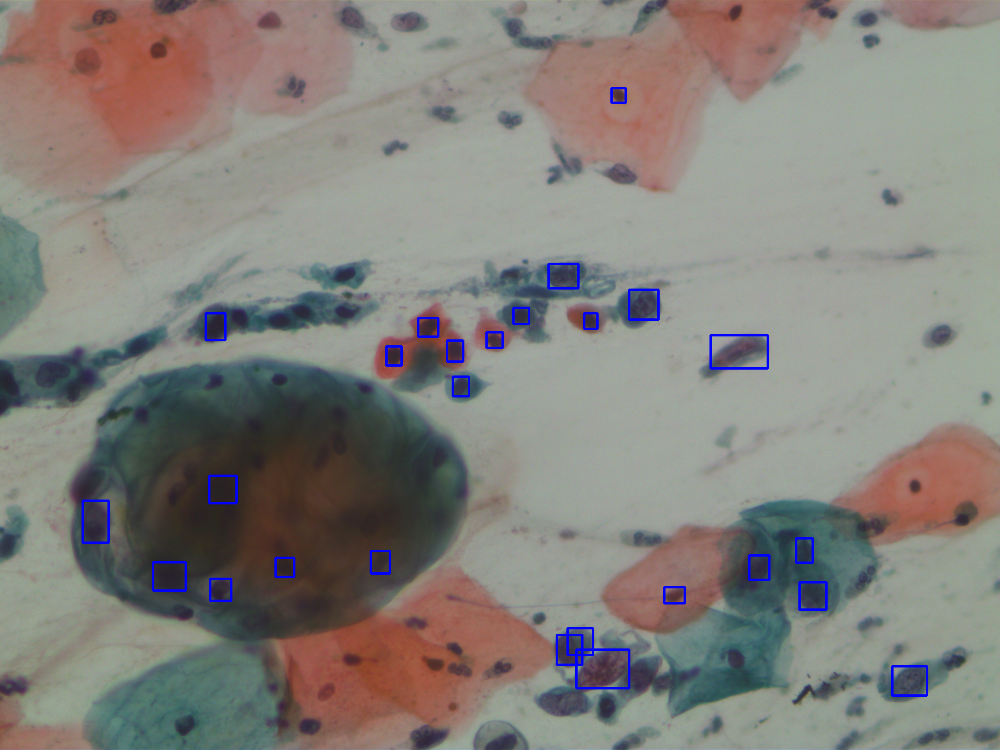

-1

In [ ]:
import torch
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import os
import pandas as pd
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

saved_model = "saved_model"  # Output directory of the save the model
filename = "IMG_2558.JPG"    # Image filename
img_path = "/content/gdrive/MyDrive/Sipakmed/im_Dyskeratotic/001.bmp"

"""
with open('labels.txt', 'r') as f:
	string = f.read()
	labels_dict = eval(string)
"""



def get_model(num_classes):

	# Load an pre-trained object detectin model (in this case faster-rcnn)
	model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

	# Number of input features
	in_features = model.roi_heads.box_predictor.cls_score.in_features

	# Replace the pre-trained head with a new head
	model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

	return model

image = cv2.imread(img_path)
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img = torchvision.transforms.ToTensor()(img)

loaded_model = get_model(6)
loaded_model.load_state_dict(torch.load(os.path.join("/content/gdrive/MyDrive/fasterRCNNfinalmodel.pt"), map_location = 'cpu'))

loaded_model.eval()
with torch.no_grad():
	prediction = loaded_model([img])
	boxes=prediction[0]["boxes"]
	print(boxes.shape)
	print("boxes:",boxes)
 
for element in boxes:
	start_point=(element[0],element[1])
	end_point=(element[2],element[3])
	print(type(element[0]))
	#print(type(image),"   ",type(start_point),"    ",type(end_point))
	cv2.rectangle(image,start_point,end_point,(255,0,0),3)
"""for element in range(len(prediction[0]['boxes'])):
	x, y, w, h = prediction[0]['boxes'][element].numpy().astype(int)
	score = np.round(prediction[0]['scores'][element].numpy(), decimals = 3)
	label_index = prediction[0]['labels'][element].numpy()
	print(label_index)
	label = labels_dict[int(label_index)]
	
	if score > 0.7:
		cv2.rectangle(image, (x, y), (w, h), (0, 0, 255), 2)
		text = str(label) + " " + str(score)
		cv2.putText(image, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
					 (255, 255, 255), 1)
"""
cv2_imshow( image)
cv2.waitKey(0)

torch.Size([3, 1536, 2048])
<class 'int'>
<class 'numpy.ndarray'>     <class 'tuple'>      <class 'tuple'>
<class 'int'>
<class 'numpy.ndarray'>     <class 'tuple'>      <class 'tuple'>
<class 'int'>
<class 'numpy.ndarray'>     <class 'tuple'>      <class 'tuple'>
<class 'int'>
<class 'numpy.ndarray'>     <class 'tuple'>      <class 'tuple'>
<class 'int'>
<class 'numpy.ndarray'>     <class 'tuple'>      <class 'tuple'>
[[ 808.75   730.25    32.      38.   ]
 [ 934.     720.5     35.5     47.5  ]
 [ 878.75   669.25    43.      39.   ]
 [1013.025  697.75    31.55    35.   ]
 [1211.6    657.63    27.      31.   ]]


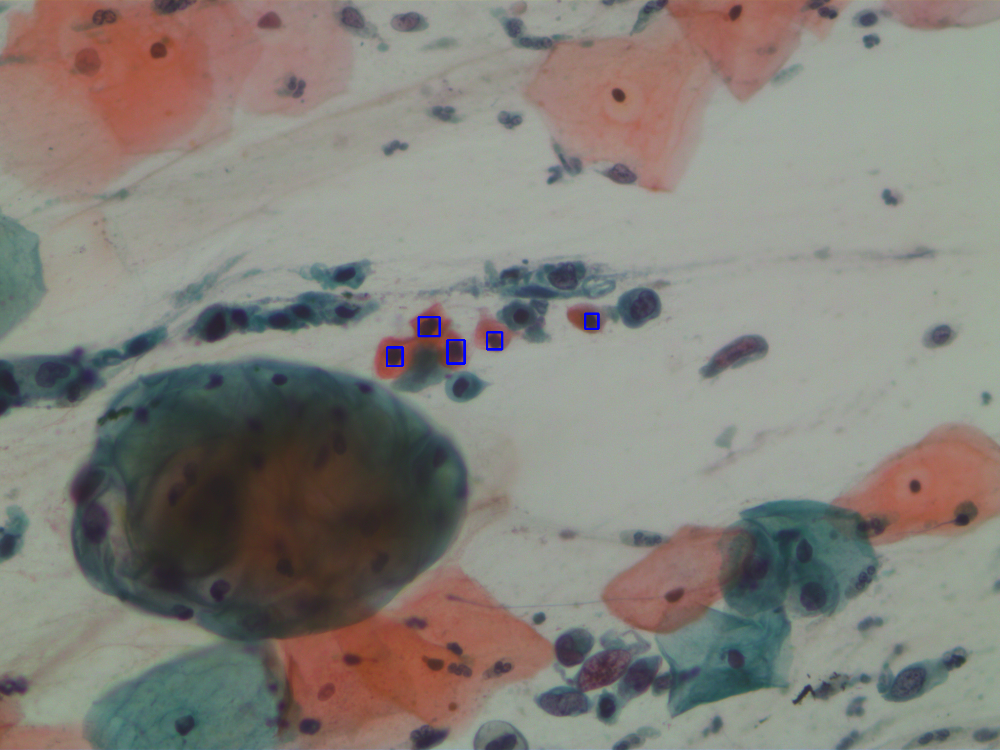

-1

In [ ]:
import torch
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import os
import pandas as pd
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

img_path = "/content/gdrive/MyDrive/Sipakmed/im_Dyskeratotic/001.bmp"
image = cv2.imread(img_path)
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img = torchvision.transforms.ToTensor()(img)
print(img.shape)

file1 = open('/content/gdrive/MyDrive/Sipakmed_result/im_Dyskeratotic/neucleus001.txt','r')
a =file1.readlines()
file1.close()
a=[b.split(" ") for b in a]
a=[[float(i) for i in b] for b in a]
for i in range(len(a)):
  xmin=int(a[i][0]-a[i][2]/2)
  xmax=int(a[i][0]+a[i][2]/2)
  ymin=int(a[i][1]-a[i][3]/2)
  ymax=int(a[i][1]+a[i][3]/2)
  print(type(xmin))
  start_point=(xmin,ymin)
  end_point=(xmax,ymax)
  print(type(image),"   ",type(start_point),"    ",type(end_point))
  cv2.rectangle(image,start_point,end_point,(255,0,0),3)
a=np.array(a)
print(a)
cv2_imshow(image)
cv2.waitKey(0)

In [ ]:
#this part is for  checking performance on test set
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CUDA = torch.cuda.is_available()
darknet = model.to(device)
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()))

since = time.time()
                                        
best_model_wts = copy.deepcopy(model.state_dict())
best_F1_score = 0.0
running_loss, running_xy_loss, running_wh_loss, running_conf_loss, running_cls_loss = 0.0, 0.0, 0.0, 0.0, 0.0
running_recall, running_precision, running_F1_score = 0.0, 0.0, 0.0
ffff=0
# iterate over data
#print(len(dataloaders_test))
for i_batch, sample_batched in enumerate(dataloaders_test):
    #print("This is iteration:",ffff)
    inputs, labels = sample_batched['input_img'], sample_batched['label']
    inputs = inputs.to(device)
    labels = labels.to(device)
    #print("labels")
    #print(labels)
            # zero the parameter gradients
    optimizer.zero_grad()

            # forward
            # track history if only in train
    #with torch.set_grad_enabled(phase == 'train'):
                
    Final_pre, *output = model(inputs, CUDA)
    Final_pre = write_results(Final_pre, confidence=0.5, num_classes=1, nms_conf=0.4)
    
    anchors = (
                [(10, 13), (16, 30), (33, 23)], [(30, 61), (62, 45), (59, 119)], [(116, 90), (156, 198), (373, 326)])

    loss_item = {"total_loss": 0, "x": 0, "y": 0, "w": 0, "h": 0, "conf": 0, "cls": 0}

    for i in range(len(output)):
      losses = Loss(output[i], labels.float(), anchors[i], inp_dim=inp_dim, num_anchors = 3, num_classes = 1)
    for i, name in enumerate(loss_item):
      loss_item[name] += losses[i]

    if isinstance(Final_pre, int) == False:
        #print("do this")
        F1_score, precision, recall = eval(Final_pre.cpu(), labels, img_width=inp_dim, img_height=inp_dim)
    else:
        F1_score, precision, recall = 0, 0, 0

        loss = loss_item['total_loss']
        xy_loss = loss_item['x']+loss_item['y']
        wh_loss = loss_item['w']+loss_item['h']
        conf_loss = loss_item['conf']
        cls_loss = loss_item['cls']

                # backward + optimize only if in training phase
                

                # statistics
        running_loss += loss.item()
        running_xy_loss += xy_loss.item()
        running_wh_loss += wh_loss.item()
        running_conf_loss += conf_loss.item()
        running_cls_loss += cls_loss.item()
        running_recall += recall
        running_precision += precision
        running_F1_score += F1_score
     
epoch_loss = running_loss / ((i_batch+1)*batch_size)
epoch_xy_loss = running_xy_loss / ((i_batch+1)*batch_size)
epoch_wh_loss = running_wh_loss / ((i_batch + 1) * batch_size)
epoch_conf_loss = running_conf_loss / ((i_batch + 1) * batch_size)
epoch_cls_loss = running_cls_loss / ((i_batch + 1) * batch_size)

epoch_recall = running_recall / (i_batch+1)
epoch_precision = running_precision / (i_batch+1)
epoch_F1_score = running_F1_score / (i_batch+1)
print(
            '{} Loss: {:.4f} Recall: {:.4f} Precision: {:.4f} F1 Score: {:.4f}'.format("test", epoch_loss, epoch_recall,
                                                                                       epoch_precision, epoch_F1_score))
print(
            '{} xy: {:.4f} wh: {:.4f} conf: {:.4f} class: {:.4f}'.format("test", epoch_xy_loss, epoch_wh_loss,
                                                                                                        epoch_conf_loss,
                                                                                                        epoch_cls_loss))
model_save_name = 'yolo.pt'
save_path = F"/content/gdrive/My Drive/yolo_output.pt" 
torch.save(best_model_wts, save_path)      

test Loss: 0.0000 Recall: 0.0000 Precision: 0.0000 F1 Score: 0.0000
test xy: 0.0000 wh: 0.0000 conf: 0.0000 class: 0.0000
